## Notebook Overview: One-Dimensional Vertical Diffusion Modeling

This notebook implements a simple 1D diffusion model to simulate vertical heat transport in Stagecoach Reservoir using measured CTD temperature profiles.

### What the Code Does:
- Loads temperature profiles measured from a CTD cast (e.g., file `CC2435009_20250517_180836.csv`).
- Defines a vertical grid and initializes thermal diffusivity (`κ`) values across layers.
- Uses a numerical solver (Thomas algorithm) to simulate the diffusion of heat through water over time.
- Animates the evolution of temperature profiles to visualize how thermal gradients smooth out under vertical diffusion.
- Compares simulated evolution with observed thermal structure to evaluate how mixing might progress in the absence of other forces.

This model provides a baseline physical scenario for vertical mixing and supports interpretation of how external factors might accelerate or suppress natural diffusive processes.

In [ ]:
## . . Import the plotting and libraries
import numpy as np
import matplotlib.pyplot as plt
from scipy import *
#
from matplotlib.animation import FuncAnimation
import matplotlib.animation as animation
#
import warnings
warnings.filterwarnings("ignore")
from IPython.display import HTML,Image
## . . For animation
from matplotlib import animation
from IPython.display import HTML

# Methods

In [ ]:
#Soured from jshragge github
#https://github.com/jshragge/CSM_GP_GEOPCOMP

import numpy as np

# --- Thomas Algorithm Solver ---
def TDMAsolver(a, b, c, d):
    """
    Tridiagonal Matrix Algorithm (TDMA) / Thomas Algorithm.
    Solves Ax = d where A is tridiagonal with vectors a (lower), b (main), c (upper).
    """
    nf = len(d)
    ac, bc, cc, dc = map(np.array, (a, b, c, d))  # copies
    for it in range(1, nf):
        mc = ac[it-1] / bc[it-1]
        bc[it] -= mc * cc[it-1]
        dc[it] -= mc * dc[it-1]
    xc = np.zeros_like(d)
    xc[-1] = dc[-1] / bc[-1]
    for il in range(nf - 2, -1, -1):
        xc[il] = (dc[il] - cc[il] * xc[il + 1]) / bc[il]
    return xc

# --- 2D Convection–Diffusion Solver (ADI + TDMA) ---
def Solve_2D_Convection_Diffusion_homogeneous_Thomas(U, K, vx, vy, dx, dy, dt, LB, RB, BB, TB):
    """
    2D convection-diffusion solver using ADI method and Thomas algorithm.
    Applies Dirichlet BCs vertically and Neumann BCs horizontally.
    """
    nx, ny = U.shape
    U1 = np.zeros_like(U)

    # Dirichlet BCs (top & bottom)
    U[:, -1] = TB
    U[:,  0] = BB
    U1[:, -1] = TB
    U1[:,  0] = BB

    # Neumann BCs (left & right)
    U[0, :] = U[1, :]
    U[-1, :] = U[-2, :]
    U1[0, :] = U1[1, :]
    U1[-1, :] = U1[-2, :]

    AX = K * dt / dx**2
    AY = K * dt / dy**2
    CX = vx * dt / dx
    CY = vy * dt / dy

    ax = -(CX + 2 * AX) * np.ones(nx - 2)
    bx =  4 * (1 + AX) * np.ones(nx - 2)
    cx =  (CX - 2 * AX) * np.ones(nx - 2)

    ay = -(CY + 2 * AY) * np.ones(ny - 2)
    by =  4 * (1 + AY) * np.ones(ny - 2)
    cy =  (CY - 2 * AY) * np.ones(ny - 2)

    dx_ = np.zeros(nx - 2)
    dy_ = np.zeros(ny - 2)

    # Solve in x-direction
    for iy in range(1, ny - 1):
        dx_[:] = -(CY - 2 * AY) * U[1:-1, iy + 1] + \
                  4 * (1 - AY) * U[1:-1, iy] + \
                 (CY + 2 * AY) * U[1:-1, iy - 1]
        dx_[0]  += (CY + 2 * AY) * U[0, iy]
        dx_[-1] += -(CY - 2 * AY) * U[-1, iy]
        U1[1:-1, iy] = TDMAsolver(ax, bx, cx, dx_)

    # Solve in y-direction
    for ix in range(1, nx - 1):
        dy_[:] = -(CX - 2 * AX) * U1[ix + 1, 1:-1] + \
                  4 * (1 - AX) * U1[ix, 1:-1] + \
                 (CX + 2 * AX) * U1[ix - 1, 1:-1]
        dy_[0]  += (CX + 2 * AX) * U[ix, 0]
        dy_[-1] += -(CX - 2 * AX) * U[ix, -1]
        U


# modeling profile exmp data

In [ ]:

# Measured CTD profile #File name CC2435009_20250517_180836.csv
temps = np.array([12.71625519, 12.81003324, 12.90241608, 12.88976015, 12.91012566,
        12.91569344, 12.91824685, 12.87830898, 12.82425944, 12.77505364,
        12.74364711, 12.71544044, 12.68130329, 12.64620775, 12.60382164,
        12.56250435, 12.50144258, 12.42041943, 12.19596718, 11.48529327,
        10.67019678, 10.39103565,  9.92050262,  9.24757719,  8.70671558,
         8.24431345,  8.03796197,  7.99503873,  7.92424598,  7.86170673,
         7.80625105])
depths = np.array([0.1532007 , 0.45897023, 0.76495438, 1.07093963, 1.37692452,
        1.68290955, 1.98889439, 2.29487811, 2.60085959, 2.90683864,
        3.21281575, 3.51879131, 3.8247653 , 4.13073758, 4.43670801,
        4.74267647, 5.04864262, 5.35460565, 5.66056256, 5.9665022 ,
        6.27241579, 6.57831309, 6.88420116, 7.19007413, 7.49593143,
        7.80177683, 8.10761465, 8.41344951, 8.71928285, 9.02511452,
        9.29260447])

# 1D Solver

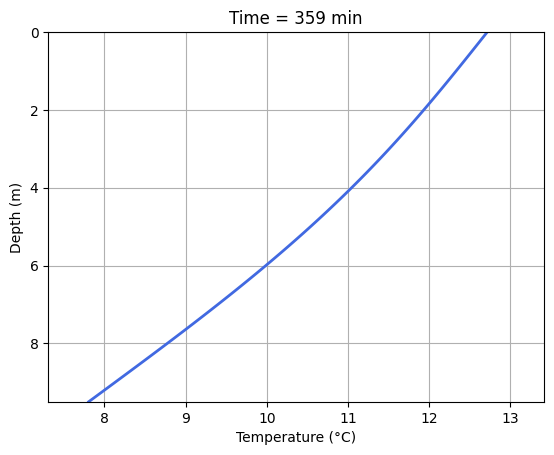

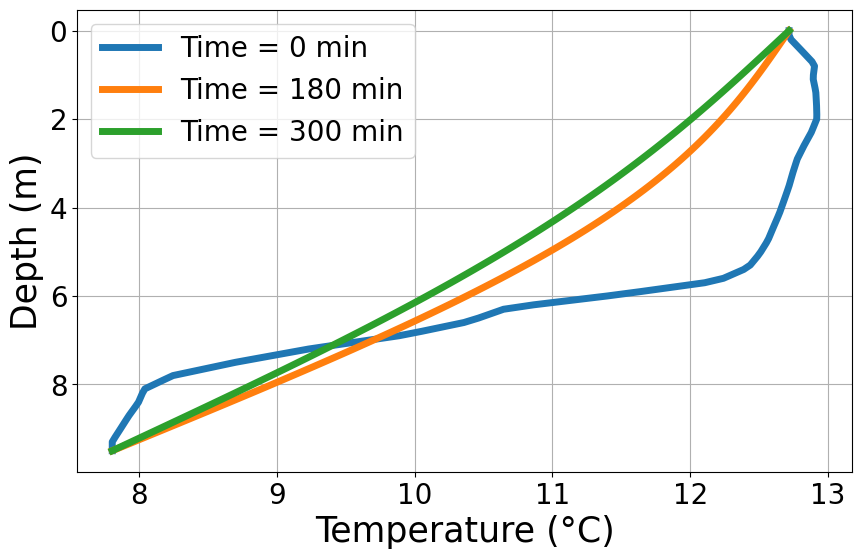

In [ ]:
# --- Interpolation to uniform grid ---
z_min, z_max, dz = 0, 9.5, 0.1  # coarser dz for longer time steps
z = np.arange(z_min, z_max + dz, dz)
nz = len(z)
T = np.interp(z, depths, temps)

# --- Physical and numerical parameters ---
kappa = 6.25e-4    # thermal diffusivity (m^2/s)
dt = 60            # 60 seconds (1-minute)
t_max = 6 * 3600   # simulate 6 hours
nt = int(t_max / dt)

alpha = kappa * dt / dz**2

# --- Time evolution array ---
T_all = np.zeros((nt, nz))
T_all[0, :] = T.copy()

# --- Dirichlet boundary conditions ---
T_top = temps[0]
T_bot = temps[-1]

# --- Tridiagonal Coefficient Matrices for Crank–Nicolson ---
a = -alpha / 2 * np.ones(nz - 2)
b = (1 + alpha) * np.ones(nz - 2)
c = -alpha / 2 * np.ones(nz - 2)

def thomas_algorithm(a, b, c, d):
    nf = len(d)
    cp = np.zeros(nf)
    dp = np.zeros(nf)
    cp[0] = c[0] / b[0]
    dp[0] = d[0] / b[0]
    for i in range(1, nf):
        denom = b[i] - a[i] * cp[i - 1]
        cp[i] = c[i] / denom
        dp[i] = (d[i] - a[i] * dp[i - 1]) / denom
    x = np.zeros(nf)
    x[-1] = dp[-1]
    for i in reversed(range(nf - 1)):
        x[i] = dp[i] - cp[i] * x[i + 1]
    return x

# --- Time stepping loop ---
for n in range(1, nt):
    RHS = np.zeros(nz - 2)
    for i in range(1, nz - 1):
        RHS[i - 1] = (alpha / 2) * T[i - 1] + (1 - alpha) * T[i] + (alpha / 2) * T[i + 1]
    # Adjust for Dirichlet boundaries
    RHS[0] += (alpha / 2) * T_top
    RHS[-1] += (alpha / 2) * T_bot

    T_new_inner = thomas_algorithm(a, b, c, RHS)
    T[0] = T_top
    T[1:-1] = T_new_inner
    T[-1] = T_bot

    T_all[n, :] = T

# --- Animation ---
fig, ax = plt.subplots()
line, = ax.plot(T_all[0], z, color='royalblue', lw=2)
ax.set_xlabel("Temperature (°C)")
ax.set_ylabel("Depth (m)")
ax.set_title("1D Heat Conduction in Water Column")
ax.grid(True)
ax.set_xlim(np.min(temps) - 0.5, np.max(temps) + 0.5)
ax.set_ylim(z_min, z_max)
ax.invert_yaxis()

def update(i):
    line.set_xdata(T_all[i])
    ax.set_title(f"Time = {i*dt/60:.0f} min")
    return line,

ani = animation.FuncAnimation(fig, update, frames=nt, interval=50, blit=True)
HTML(ani.to_jshtml())



# 2D

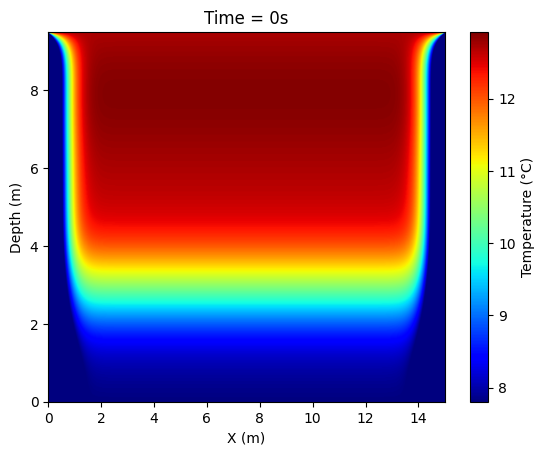

In [ ]:
# --- Simulation Setup ---
# Method is slighly innacurate because of
kappa = 6.25e-4
vx, vy = 0, 0
dt = 1
t_max = 300
a, b = 15, 9.5
dx, dy = 0.02, 0.02

x_vals = np.arange(0, a + dx, dx)
y_vals = np.arange(0, b + dy, dy)
X, Y = np.meshgrid(x_vals, y_vals, indexing='ij')
nx, ny = len(x_vals), len(y_vals)
nt = int(t_max / dt)

# Interpolated initial condition from CTD
U = np.zeros((nx, ny))
for i in range(nx):
    U[i, :] = np.interp(Y[i, :], depths, temps)

# Enforce Neumann BCs on initial state (zero-gradient)
U[0, :] = U[1, :]      # Left boundary
U[-1, :] = U[-2, :]    # Right boundary

# Dirichlet BCs (top and bottom), Neumann (left/right handled in solver)
TB = temps[0]    # top (shallow surface)
BB = temps[-1]   # bottom (deep)
LB = RB = 0      # not used (Neumann sides)


# --- HTML Animation Setup ---
fig, ax1 = plt.subplots()
im = ax1.imshow(U.T, origin='upper', extent=[0, a, 0, b], cmap='jet', aspect='auto')
cbar = fig.colorbar(im)
cbar.set_label('Temperature (°C)')
ax1.set_xlabel('X (m)')
ax1.set_ylabel('Depth (m)')
title = ax1.set_title('Time = 0s')


# Animate with HTML controls
anim = animation.FuncAnimation(fig, convection_diffusion_2d_animate, frames=nt, interval=50, blit=False)
HTML(anim.to_jshtml())


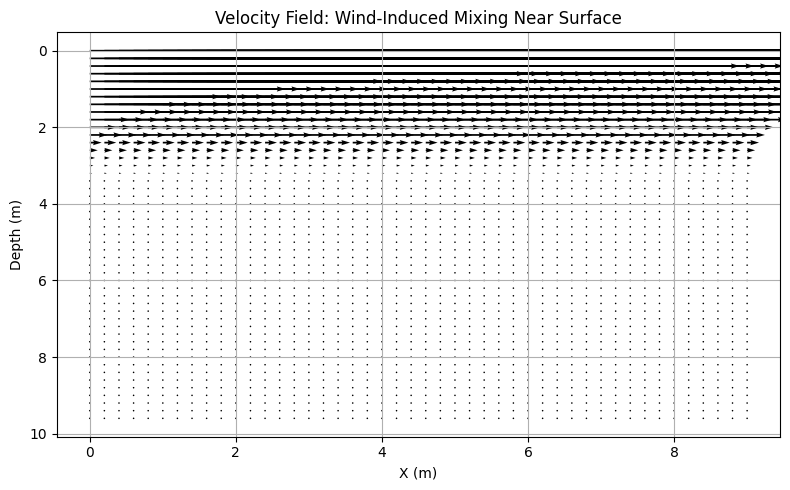

In [ ]:
# Pilot Model for adding advection (wind + currents)

# Grid setup
a, b = 9, 9.5
dx, dy = 0.2, 0.2  # Coarser grid for visualization
x_vals = np.arange(0, a + dx, dx)
y_vals = np.arange(0, b + dy, dy)
X, Y = np.meshgrid(x_vals, y_vals, indexing='ij')

# Velocity field function (wind at surface decaying exponentially with depth)
def velocity_field(x, y):
    vx = 0.01 * np.exp(-y / 0.5)
    vy = 0
    return vx, vy

# Evaluate velocity field over grid
VX = np.zeros_like(X)
VY = np.zeros_like(Y)

for i in range(X.shape[0]):
    for j in range(X.shape[1]):
        vx, vy = velocity_field(X[i, j], Y[i, j])
        VX[i, j] = vx
        VY[i, j] = vy

# Plotting the vector field
plt.figure(figsize=(8, 5))
plt.quiver(X, Y, VX, VY, scale=0.005, color='black')
plt.gca().invert_yaxis()
plt.xlabel('X (m)')
plt.ylabel('Depth (m)')
plt.title('Velocity Field: Wind-Induced Mixing Near Surface')
plt.grid(True)
plt.tight_layout()
plt.show()
